#Snakes( Active contour Model)

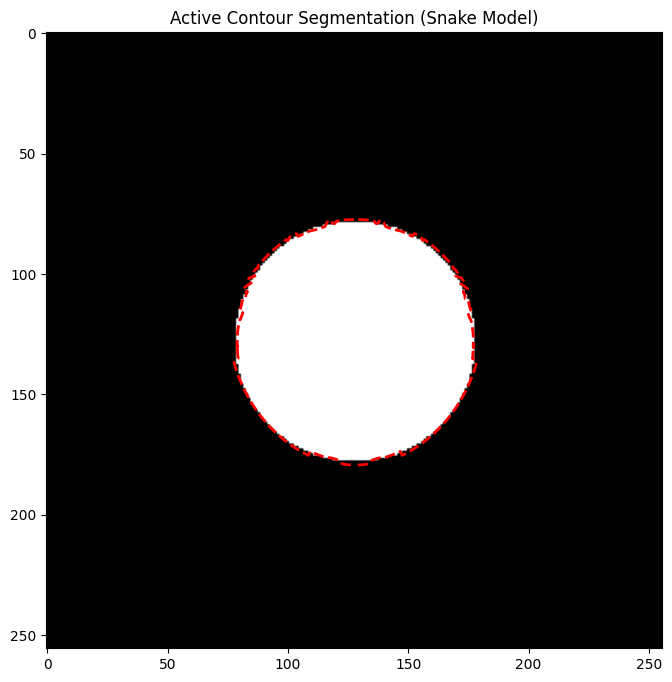

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.draw import disk
from skimage import img_as_float
from skimage.segmentation import active_contour
from skimage.filters import gaussian

# Step 1: Create a synthetic image with a circle
image_size = (256, 256)  # Image size (height, width)
image = np.zeros(image_size)

# Draw a circle in the center of the image (radius 50)
rr, cc = disk((128, 128), 50)
image[rr, cc] = 1  # Set the pixels inside the circle to 1

# Step 2: Save the image in .npy format
np.save('/synthetic_image.npy', image)

# Step 3: Load the synthetic image from .npy format
image = np.load('/synthetic_image.npy')

# Step 4: Apply Active Contour (Snake Model)
# Convert image to float and apply Gaussian smoothing
image = img_as_float(image)
image_smooth = gaussian(image, sigma=1)

# Generate an initial contour (ellipse) around the center of the image
s = np.linspace(0, 2 * np.pi, 400)
x = 100 * np.cos(s) + 128  # center at (128, 128)
y = 100 * np.sin(s) + 128
initial_contour = np.array([x, y]).T

# Apply the active contour model (snake)
snake = active_contour(image_smooth, initial_contour, alpha=0.015, beta=10, gamma=0.001)

# Step 5: Plot the results
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.imshow(image, cmap='gray')
ax.plot(snake[:, 1], snake[:, 0], '--', color='r', lw=2)  # Plot the contour (snake)
ax.set_title("Active Contour Segmentation (Snake Model)")

plt.show()


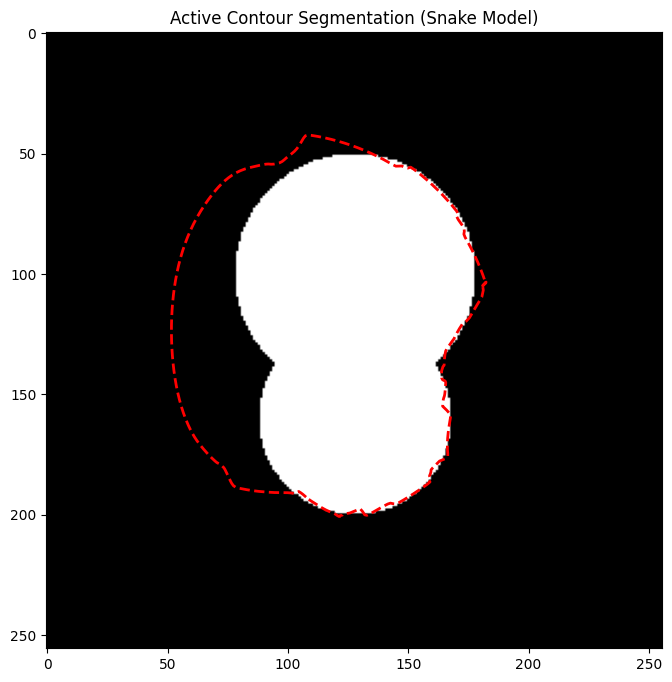

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.draw import disk
from skimage import img_as_float
from skimage.segmentation import active_contour
from skimage.filters import gaussian

# Step 1: Create a synthetic image with two circles
image_size = (256, 256)  # Image size (height, width)
image = np.zeros(image_size)

# Draw two circles in the center of the image
rr1, cc1 = disk((100, 128), 50)  # First circle at (128, 100)
image[rr1, cc1] = 1  # Set the pixels inside the first circle to 1

rr2, cc2 = disk((160, 128), 40)  # Second circle at (128, 160)
image[rr2, cc2] = 1  # Set the pixels inside the second circle to 1

# Step 2: Convert the image to float and apply Gaussian smoothing
image = img_as_float(image)
image_smooth = gaussian(image, sigma=1)

# Step 3: Generate an initial contour (ellipse) around the center of the first circle
s = np.linspace(0, 2 * np.pi, 400)
x = 100 * np.cos(s) + 128  # center at (128, 128)
y = 100 * np.sin(s) + 100
initial_contour = np.array([x, y]).T

# Step 4: Apply the active contour model (snake) to the image
snake = active_contour(image_smooth, initial_contour, alpha=0.02, beta=50, gamma=0.001)

# Step 5: Plot the results
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.imshow(image, cmap='gray')
ax.plot(snake[:, 1], snake[:, 0], '--', color='r', lw=2)  # Plot the contour (snake)
ax.set_title("Active Contour Segmentation (Snake Model)")

plt.show()


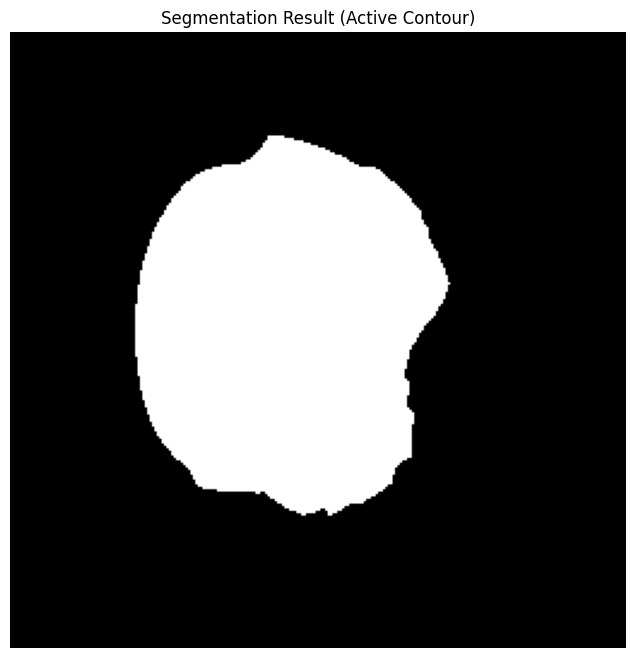

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.draw import disk, polygon
from skimage import img_as_float
from skimage.segmentation import active_contour
from skimage.filters import gaussian
from PIL import Image

# Step 1: Create a synthetic image with two circles
image_size = (256, 256)  # Image size (height, width)
image = np.zeros(image_size)

# Draw two circles in the center of the image
rr1, cc1 = disk((100, 128), 50)  # First circle at (128, 100)
image[rr1, cc1] = 1  # Set the pixels inside the first circle to 1

rr2, cc2 = disk((160, 128), 40)  # Second circle at (128, 160)
image[rr2, cc2] = 1  # Set the pixels inside the second circle to 1

# Step 2: Convert the image to float and apply Gaussian smoothing
image = img_as_float(image)
image_smooth = gaussian(image, sigma=1)

# Step 3: Generate an initial contour (ellipse) around the center of the first circle
s = np.linspace(0, 2 * np.pi, 400)
x = 100 * np.cos(s) + 128  # center at (128, 128)
y = 100 * np.sin(s) + 100
initial_contour = np.array([x, y]).T

# Step 4: Apply the active contour model (snake) to the image
snake = active_contour(image_smooth, initial_contour, alpha=0.02, beta=50, gamma=0.001)

# Step 5: Create a binary mask based on the active contour
# Initialize a blank mask
segmentation_mask = np.zeros_like(image)

# Use polygon to fill the area enclosed by the snake contour
rr, cc = polygon(snake[:, 0], snake[:, 1])

# Ensure the coordinates are within the image bounds
rr = np.clip(rr, 0, image.shape[0] - 1)
cc = np.clip(cc, 0, image.shape[1] - 1)

# Fill the inside of the contour with 1 (white)
segmentation_mask[rr, cc] = 1

# Step 6: Save the segmentation result (binary mask) as a PNG image
output_path = '/content/snake_segmentation_result.png'
segmentation_mask_pil = Image.fromarray((segmentation_mask * 255).astype(np.uint8))  # Convert to uint8 and scale to 255
segmentation_mask_pil.save(output_path)

# Display the saved output path
output_path

# Step 6: Plot the segmentation result (without the contour line)
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.imshow(segmentation_mask, cmap='gray')  # Show only the segmented region (binary mask)
ax.set_title("Segmentation Result (Active Contour)")
ax.axis('off')  # Turn off axis

plt.show()


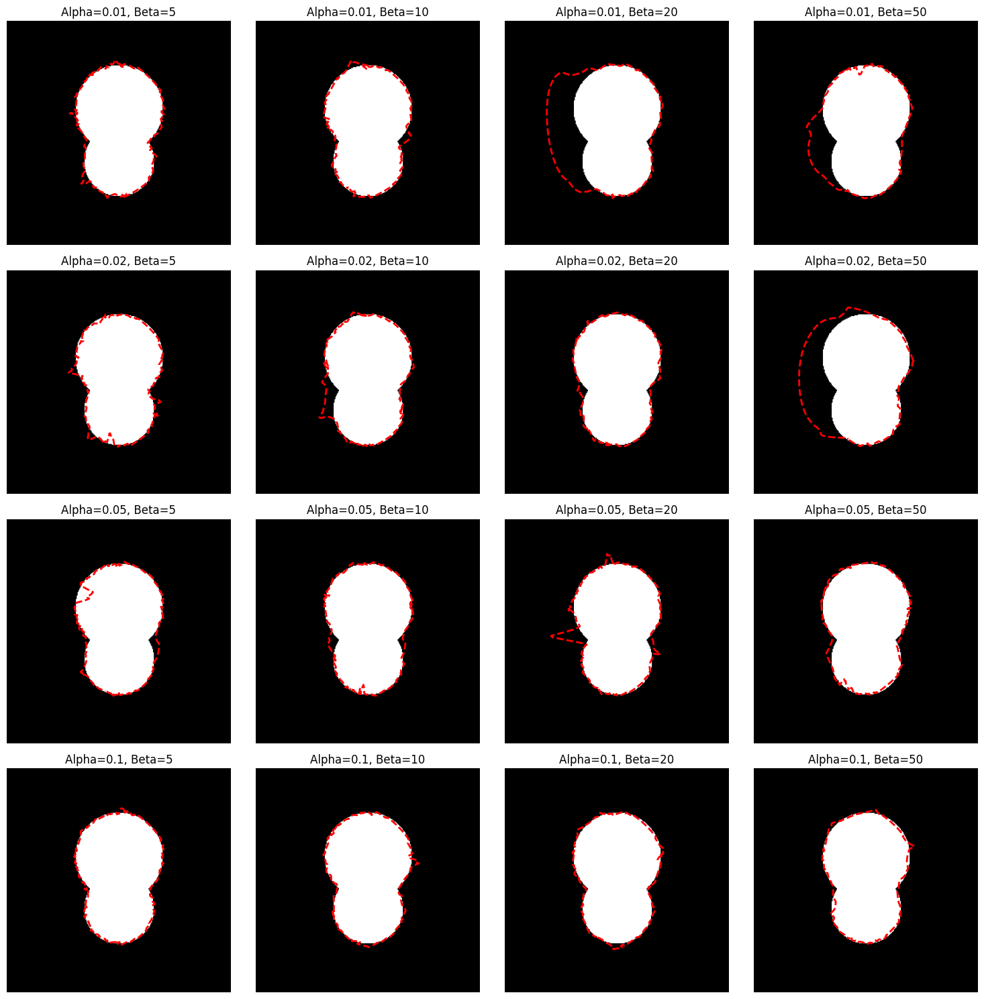

In [ ]:
# Define different values for alpha and beta
alpha_values = [0.01, 0.02, 0.05, 0.1]
beta_values = [5, 10, 20, 50]

# Step 1: Create a synthetic image with two circles
image_size = (256, 256)  # Image size (height, width)
image = np.zeros(image_size)

# Draw two circles in the center of the image
rr1, cc1 = disk((100, 128), 50)  # First circle at (128, 100)
image[rr1, cc1] = 1  # Set the pixels inside the first circle to 1

rr2, cc2 = disk((160, 128), 40)  # Second circle at (128, 160)
image[rr2, cc2] = 1  # Set the pixels inside the second circle to 1

# Convert the image to float and apply Gaussian smoothing
image = img_as_float(image)
image_smooth = gaussian(image, sigma=1)

# Generate an initial contour (ellipse) around the center of the first circle
s = np.linspace(0, 2 * np.pi, 400)
x = 100 * np.cos(s) + 128  # center at (128, 128)
y = 100 * np.sin(s) + 100
initial_contour = np.array([x, y]).T

# Step 2: Apply Active Contour with different values of alpha and beta
fig, axes = plt.subplots(len(alpha_values), len(beta_values), figsize=(15, 15))

for i, alpha in enumerate(alpha_values):
    for j, beta in enumerate(beta_values):
        snake = active_contour(image_smooth, initial_contour, alpha=alpha, beta=beta, gamma=0.001)
        ax = axes[i, j]
        ax.imshow(image, cmap='gray')
        ax.plot(snake[:, 1], snake[:, 0], '--', color='r', lw=2)  # Plot the contour (snake)
        ax.set_title(f"Alpha={alpha}, Beta={beta}")
        ax.set_axis_off()

fig.tight_layout()
plt.show()


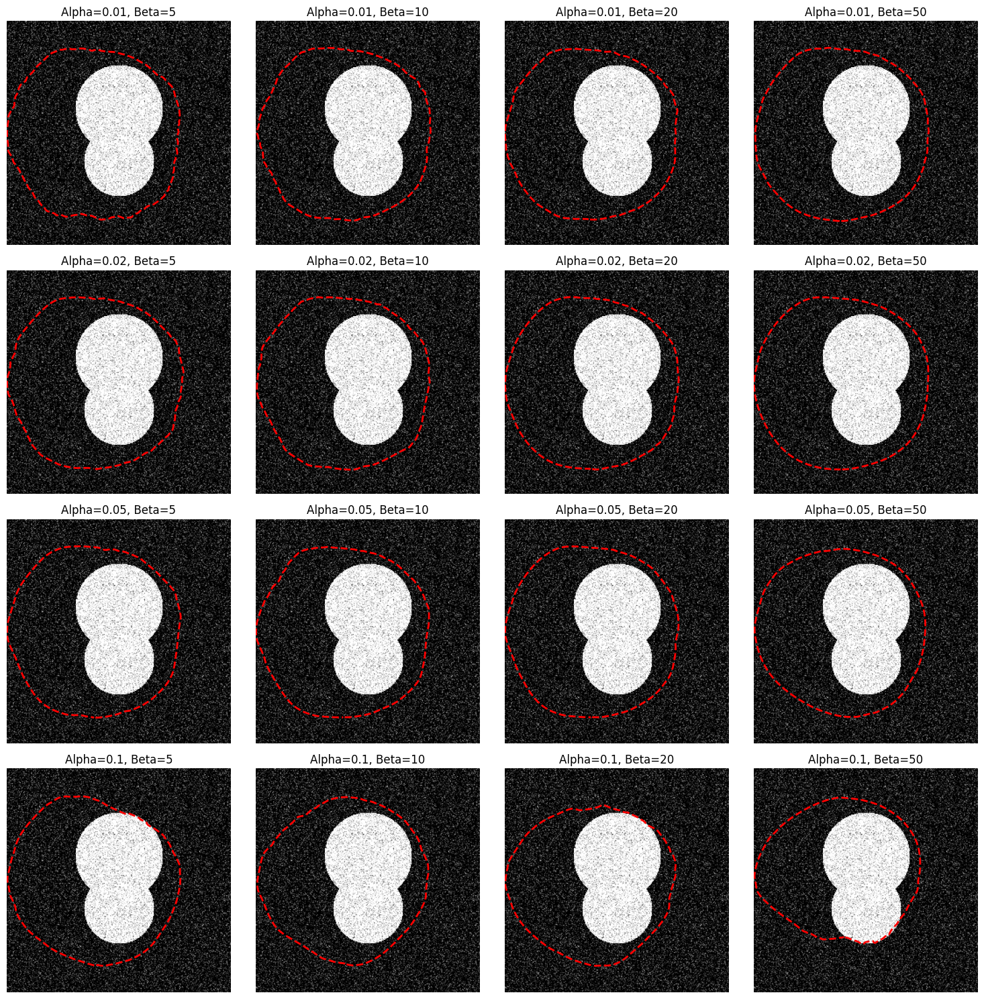

'/content/active_contour_highres.png'

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.draw import disk
from skimage.util import random_noise
from skimage import img_as_float
from skimage.filters import gaussian
from skimage.segmentation import active_contour

# Define different values for alpha and beta
alpha_values = [0.01, 0.02, 0.05, 0.1]
beta_values = [5, 10, 20, 50]

# Step 1: Create a synthetic image with two circles
image_size = (256, 256)  # Image size (height, width)
image = np.zeros(image_size)

# Draw two circles in the center of the image
rr1, cc1 = disk((100, 128), 50)  # First circle at (128, 100)
image[rr1, cc1] = 1  # Set the pixels inside the first circle to 1

rr2, cc2 = disk((160, 128), 40)  # Second circle at (128, 160)
image[rr2, cc2] = 1  # Set the pixels inside the second circle to 1

# Step 2: Add Gaussian noise to the image
image_with_noise = random_noise(image, mode='gaussian', mean=0, var=0.05)  # Add medium Gaussian noise

# Convert the image to float and apply Gaussian smoothing
image_with_noise = img_as_float(image_with_noise)
image_smooth = gaussian(image_with_noise, sigma=1)

# Generate an initial contour (ellipse) around the center of the first circle
s = np.linspace(0, 2 * np.pi, 400)
x = 100 * np.cos(s) + 128  # center at (128, 128)
y = 100 * np.sin(s) + 100
initial_contour = np.array([x, y]).T

# Step 3: Apply Active Contour with different values of alpha and beta
fig, axes = plt.subplots(len(alpha_values), len(beta_values), figsize=(15, 15))

for i, alpha in enumerate(alpha_values):
    for j, beta in enumerate(beta_values):
        snake = active_contour(image_smooth, initial_contour, alpha=alpha, beta=beta, gamma=0.001)
        ax = axes[i, j]
        ax.imshow(image_with_noise, cmap='gray')  # Plot the noisy image
        ax.plot(snake[:, 1], snake[:, 0], '--', color='r', lw=2)  # Plot the contour (snake)
        ax.set_title(f"Alpha={alpha}, Beta={beta}")
        ax.set_axis_off()

# Save the plot in high resolution (300 DPI)
output_path_highres = '/content/active_contour_highres.png'
plt.tight_layout()
plt.savefig(output_path_highres, dpi=300)  # Save the figure as a high-resolution PNG

# Show the plot
plt.show()

# Return the path for downloading
output_path_highres


In [ ]:
import numpy as np
from skimage.draw import disk
import os

# Create a synthetic image with two circles
image_size = (256, 256)  # Image size (height, width)
image = np.zeros(image_size)

# Draw two circles in the center of the image
rr1, cc1 = disk((100, 128), 50)  # First circle at (128, 100)
image[rr1, cc1] = 1  # Set the pixels inside the first circle to 1

rr2, cc2 = disk((160, 128), 40)  # Second circle at (128, 160)
image[rr2, cc2] = 1  # Set the pixels inside the second circle to 1

# Save the synthetic image with two circles as a .npy file
save_path = '/content/two_circles_image.npy'
np.save(save_path, image)

save_path  # Return the path to the saved file for download



'/content/two_circles_image.npy'

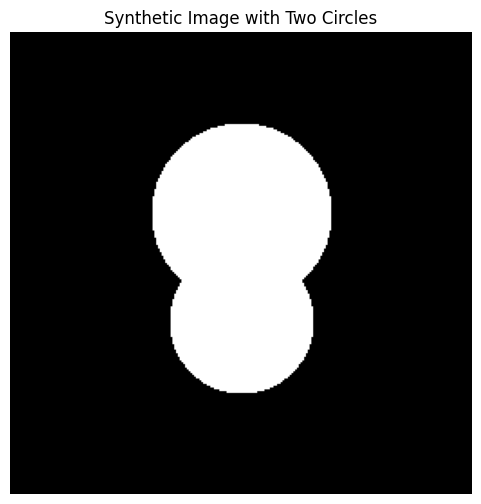

In [ ]:
import matplotlib.pyplot as plt

# Load the saved synthetic image with two circles
image = np.load('/content/two_circles_image.npy')

# Plot the synthetic image
plt.figure(figsize=(6, 6))
plt.imshow(image, cmap='gray')
plt.title("Synthetic Image with Two Circles")
plt.axis('off')
plt.show()


#Level set on this

In [ ]:
import numpy as np
from PIL import Image, ImageFilter
from sklearn.metrics import mean_squared_error

def default_phi(x, mode=1, width=5):
    # Initialize surface phi at the border (width px from the border) of the image
    # or at the center of the image as a width by width square
    # i.e. 1 outside the curve, and -1 inside the curve
    if mode == 1:
        phi = -1 * np.ones([x.shape[0], x.shape[1]])  # x.shape instead of x.size
        phi[int(x.shape[0] / 2) - width:int(x.shape[0] / 2) + width,
            int(x.shape[1] / 2) - width:int(x.shape[1] / 2) + width] = 1
    elif mode == 2:
        phi = 1. * np.ones([x.shape[0], x.shape[1]])  # x.shape instead of x.size
        phi[5:x.shape[0] - width, width:x.shape[1] - width] = -1.
    return phi

# Level set Boundary evolution with Gaussian smoothing for edges
def lss(img, dt=1, freq=20, rad=3, smoothing_radius=2):
    print("Original image mode:", img.mode)  # Debugging line to check the image mode

    img = img.convert('L')  # Convert to grayscale
    print("Converted to grayscale:", img.mode)  # Check the mode after conversion

    img = np.array(img)  # Convert image to a NumPy array for processing
    img = img - np.mean(img)  # Normalize image by subtracting the mean

    # Apply Gaussian smoothing to the image
    img_smoothed = Image.fromarray(np.uint8(img))  # Ensure the image is uint8 type
    print("Before Gaussian blur mode:", img_smoothed.mode)  # Debugging line

    img_smoothed = img_smoothed.filter(ImageFilter.GaussianBlur(radius=smoothing_radius))  # Apply blur
    print("After Gaussian blur mode:", img_smoothed.mode)  # Check mode after Gaussian blur

    img_smoothed = np.array(img_smoothed)  # Convert back to numpy array after applying Gaussian blur

    u = default_phi(img_smoothed, mode=2)  # Initialize level set function with smoothed image

    # Compute gradient of smoothed image
    dx, dy = np.gradient(img_smoothed)  # Compute gradient of the smoothed image
    Du = np.sqrt(dx ** 2 + dy ** 2)  # Compute gradient magnitude (edge strength)
    v = 1. / (1. + Du)  # Smoothness factor based on edge strength

    data = [Du, u]  # Store gradient magnitude and initial level set
    u_old = u  # Store old level set
    niter = 0  # Iteration counter
    MSE_OLD = 1e+03  # Initial MSE value
    change = 1e+03  # Initial change value

    while change > 1e-15:  # Loop until convergence
        niter += 1
        dx, dy = np.gradient(u)  # Compute gradient of the level set
        Du = np.sqrt(dx ** 2 + dy ** 2)  # Compute gradient magnitude
        u += dt * v * Du  # Update level set using edge strength and smoothing factor

        u = np.where(u < 0, -1., 1.)  # Threshold the level set to be -1 or 1

        # Compute Mean Squared Error to check for convergence
        MSE = mean_squared_error(u_old, u)
        u_old = u  # Store the new level set
        change = abs(MSE - MSE_OLD)  # Check change in MSE
        MSE_OLD = MSE  # Update old MSE value

        if niter % freq == 0:
            data.append(u)  # Store intermediate results for visualization

    u = np.where(u < 0, 1., 0.)  # Final thresholding
    data.append(u)  # Store final result

    return data, niter


In [ ]:
def plot_boundary(img, segment):
  rad = 3
  img = img.convert("RGB")
  edge = Image.fromarray(segment).convert("L").filter(ImageFilter.GaussianBlur(radius = rad)).filter(ImageFilter.FIND_EDGES)
  for x in range(rad,img.size[0]-rad):
      for y in range(rad,img.size[1]-rad):
        if edge.getpixel((x,y)) != 0:
            for i in [-1,0,1]:
                for j in [-1,0,1]:
                    img.putpixel( (x+i,y+j), (255,0,255) )

  return img

#Saves the boundary evolution as a gif file
def evolution_gif(img, data, file_name = 'dummy.gif', duration = 400, loop = 2):
  images = []
  for i in range(2,len(data)):
    tmp =plot_boundary(img, data[i])
    images.append(tmp)

  images[0].save(file_name, save_all=True, append_images=images[1:], optimize=False, duration=duration, loop=loop)



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.draw import disk

# Step 1: Create a synthetic image with two circles
image_size = (256, 256)  # Image size (height, width)
image = np.zeros(image_size)

# Draw two circles in the center of the image
rr1, cc1 = disk((100, 128), 50)  # First circle at (128, 100)
image[rr1, cc1] = 1  # Set the pixels inside the first circle to 1

rr2, cc2 = disk((160, 128), 40)  # Second circle at (128, 160)
image[rr2, cc2] = 1  # Set the pixels inside the second circle to 1

# Step 2: Save the synthetic image with two circles as a PNG file
output_path = '/content/circle.png'
plt.imsave(output_path, image, cmap='gray')

output_path  # Return the path to the saved PNG file for download


'/content/circle.png'

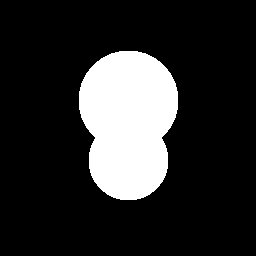

In [ ]:
img = Image.open("/content/circle.png")
display(img)


In [ ]:
#Perform level set boundary evolution
data, niter = lss(img,dt = 1, freq = 10)

Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L


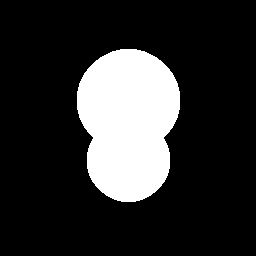

In [ ]:
from PIL import ImageOps

# Show the converged boundary as a binary mask image
display(ImageOps.autocontrast(Image.fromarray(data[-1]).convert('L')))



In [ ]:
from PIL import ImageOps, Image

# Assuming `data[-1]` is the final boundary image
boundary_image = Image.fromarray(data[-1]).convert('L')

# Apply autocontrast to enhance the image
boundary_image = ImageOps.autocontrast(boundary_image)

# Display the image
boundary_image.show()

# Save the image
save_path = '/content/simpel levelset seg.png'
boundary_image.save(save_path)

# Display the save path
save_path


'/content/simpel levelset seg.png'

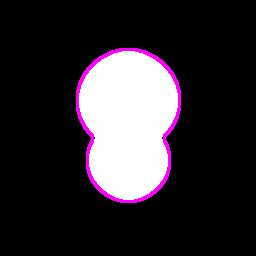

In [ ]:
#Show the converged boundary
display(plot_boundary(img, data[-1]))

#Adding Blur and Test with simple level set

Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode

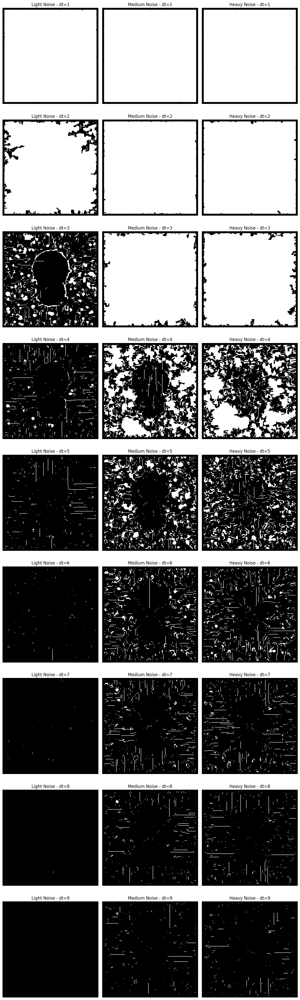

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# Load the noisy images
img_light = Image.open("/content/noise_light.png")
img_medium = Image.open("/content/noise_medium.png")
img_heavy = Image.open("/content/noise_heavy.png")

# Function to apply level set and plot for different dt values
def apply_level_set_for_dt(img, dt_values):
    results = []
    for dt in dt_values:
        data, niter = lss(img, dt=dt, freq=10)  # Apply level set method
        results.append((data[-1], niter, dt))
    return results

# Define dt values ranging from 1 to 20
dt_values = list(range(1, 10))

# Apply Level Set method on the noisy images for dt values from 1 to 20
light_noise_results = apply_level_set_for_dt(img_light, dt_values)
medium_noise_results = apply_level_set_for_dt(img_medium, dt_values)
heavy_noise_results = apply_level_set_for_dt(img_heavy, dt_values)

# Plot the results for each noisy image with different dt values
fig, axes = plt.subplots(9, 3, figsize=(12, 40))

# Plot for each dt value in each row
for i, (dt) in enumerate(dt_values):
    # Light noise results
    axes[i, 0].imshow(ImageOps.autocontrast(Image.fromarray(light_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 0].set_title(f"Light Noise - dt={dt}")
    axes[i, 0].axis('off')

    # Medium noise results
    axes[i, 1].imshow(ImageOps.autocontrast(Image.fromarray(medium_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 1].set_title(f"Medium Noise - dt={dt}")
    axes[i, 1].axis('off')

    # Heavy noise results
    axes[i, 2].imshow(ImageOps.autocontrast(Image.fromarray(heavy_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 2].set_title(f"Heavy Noise - dt={dt}")
    axes[i, 2].axis('off')

# Show the plot
plt.tight_layout()
plt.show()


#Saving a few results

Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode

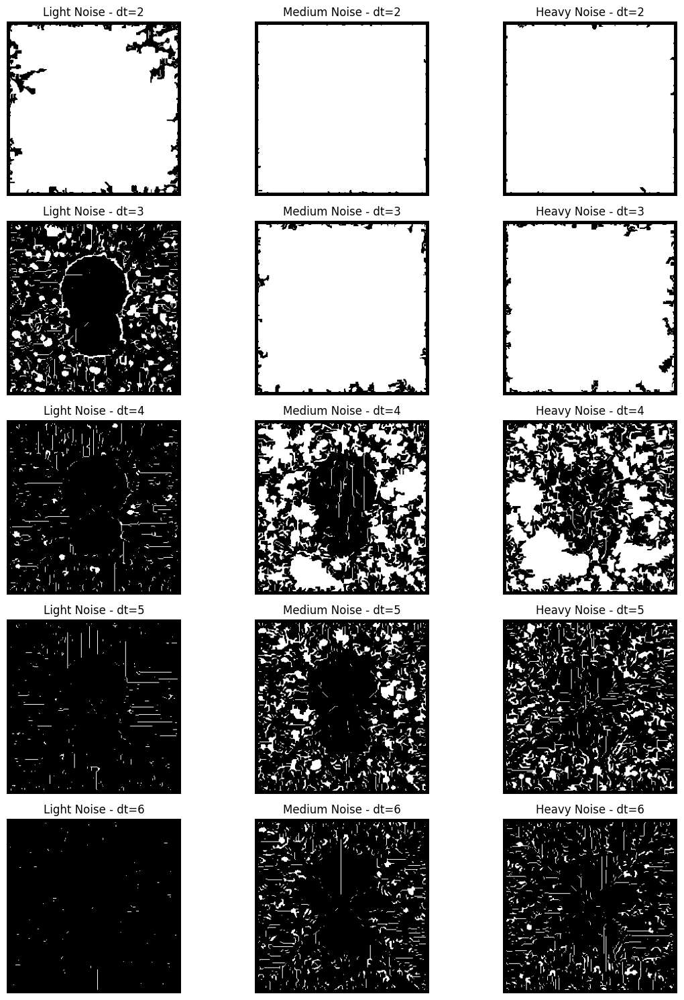

'/content/noisy_images_results.png'

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# Load the noisy images
img_light = Image.open("/content/noise_light.png")
img_medium = Image.open("/content/noise_medium.png")
img_heavy = Image.open("/content/noise_heavy.png")

# Function to apply level set and plot for different dt values
def apply_level_set_for_dt(img, dt_values):
    results = []
    for dt in dt_values:
        data, niter = lss(img, dt=dt, freq=10)  # Apply level set method
        results.append((data[-1], niter, dt))
    return results

# Define dt values from 2 to 8 with a step of 2
dt_values = list(range(2, 7, 1))  # [2, 4, 6, 8]

# Apply Level Set method on the noisy images for dt values from 2 to 8
light_noise_results = apply_level_set_for_dt(img_light, dt_values)
medium_noise_results = apply_level_set_for_dt(img_medium, dt_values)
heavy_noise_results = apply_level_set_for_dt(img_heavy, dt_values)

# Plot the results for each noisy image with different dt values
fig, axes = plt.subplots(len(dt_values), 3, figsize=(12, 15))

# Plot for each dt value in each row
for i, dt in enumerate(dt_values):
    # Light noise results
    axes[i, 0].imshow(ImageOps.autocontrast(Image.fromarray(light_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 0].set_title(f"Light Noise - dt={dt}")
    axes[i, 0].axis('off')

    # Medium noise results
    axes[i, 1].imshow(ImageOps.autocontrast(Image.fromarray(medium_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 1].set_title(f"Medium Noise - dt={dt}")
    axes[i, 1].axis('off')

    # Heavy noise results
    axes[i, 2].imshow(ImageOps.autocontrast(Image.fromarray(heavy_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 2].set_title(f"Heavy Noise - dt={dt}")
    axes[i, 2].axis('off')

# Save the final plot as a high-resolution image
output_path = '/content/noisy_images_results.png'
plt.tight_layout()
plt.savefig(output_path, dpi=300)  # Save the figure with high resolution (300 DPI)

# Show the plot
plt.show()

# Return the path for downloading
output_path


#The new level set

In [ ]:
# without max iter
import numpy as np
from PIL import Image
from scipy.ndimage import sobel
from sklearn.metrics import mean_squared_error

def default_phi(x, mode=1, width=5):
    # Initialize surface phi at the border (width px from the border) of the image
    # or at the center of the image as a width by width square
    # i.e. 1 outside the curve, and -1 inside the curve
    if mode == 1:
        phi = -1 * np.ones([x.shape[0], x.shape[1]])  # x.shape instead of x.size
        phi[int(x.shape[0] / 2) - width:int(x.shape[0] / 2) + width,
            int(x.shape[1] / 2) - width:int(x.shape[1] / 2) + width] = 1
    elif mode == 2:
        phi = 1. * np.ones([x.shape[0], x.shape[1]])  # x.shape instead of x.size
        phi[5:x.shape[0] - width, width:x.shape[1] - width] = -1.
    return phi

# Level set Boundary evolution with Sobel edge-based external energy
def lss_new(img, dt=1, freq=20, rad=3):
    print("Original image mode:", img.mode)  # Debugging line to check the image mode

    img = img.convert('L')  # Convert to grayscale
    print("Converted to grayscale:", img.mode)  # Check the mode after conversion

    img = np.array(img)  # Convert image to a NumPy array for processing
    img = img - np.mean(img)  # Normalize image by subtracting the mean

    # Apply Sobel edge detection
    dx = sobel(img, axis=0)  # Gradient in x direction
    dy = sobel(img, axis=1)  # Gradient in y direction
    Du = np.sqrt(dx**2 + dy**2)  # Gradient magnitude (edge strength)
    v = 1. / (1. + 0.5 * Du)  # Smoothness factor based on edge strength

    print("Sobel edge strength calculated.")

    # Initialize the level set function
    u = default_phi(img, mode=2)  # Initialize level set function with smoothed image

    data = [Du, u]  # Store gradient magnitude and initial level set
    u_old = u  # Store old level set
    niter = 0  # Iteration counter
    MSE_OLD = 1e+03  # Initial MSE value
    change = 1e+03  # Initial change value

    while change > 1e-5:  # Loop until convergence
        niter += 1
        dx, dy = np.gradient(u)  # Compute gradient of the level set
        Du = np.sqrt(dx ** 2 + dy ** 2)  # Compute gradient magnitude
        u += dt * v * Du  # Update level set using edge strength and smoothing factor

        u = np.where(u < 0, -1., 1.)  # Threshold the level set to be -1 or 1

        # Compute Mean Squared Error to check for convergence
        MSE = mean_squared_error(u_old, u)
        u_old = u  # Store the new level set
        change = abs(MSE - MSE_OLD)  # Check change in MSE
        MSE_OLD = MSE  # Update old MSE value


        print(f"MSE Value : {MSE} and Iteration number: {niter}")


        if niter % freq == 0:
            data.append(u)  # Store intermediate results for visualization

    u = np.where(u < 0, 1., 0.)  # Final thresholding
    data.append(u)  # Store final result

    return data, niter


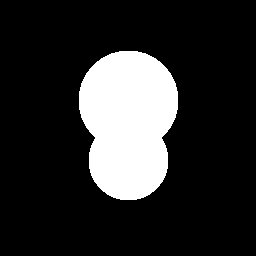

In [ ]:
img = Image.open("/content/circle.png")
display(img)

In [ ]:
#Perform level set boundary
data, niter = lss_new(img,dt = 1, freq = 10)

Original image mode: RGBA
Converted to grayscale: L
Sobel edge strength calculated.
MSE Value : 0.029928170516998757 and Iteration number: 1
MSE Value : 0.029684029891998757 and Iteration number: 2
MSE Value : 0.029439889266998757 and Iteration number: 3
MSE Value : 0.029195748641998757 and Iteration number: 4
MSE Value : 0.028951608016998757 and Iteration number: 5
MSE Value : 0.028707467391998757 and Iteration number: 6
MSE Value : 0.028463326766998757 and Iteration number: 7
MSE Value : 0.028219186141998757 and Iteration number: 8
MSE Value : 0.027975045516998757 and Iteration number: 9
MSE Value : 0.027730904891998757 and Iteration number: 10
MSE Value : 0.027486764266998757 and Iteration number: 11
MSE Value : 0.027242623641998757 and Iteration number: 12
MSE Value : 0.026998483016998757 and Iteration number: 13
MSE Value : 0.026754342391998757 and Iteration number: 14
MSE Value : 0.026510201766998757 and Iteration number: 15
MSE Value : 0.026266061141998757 and Iteration number: 

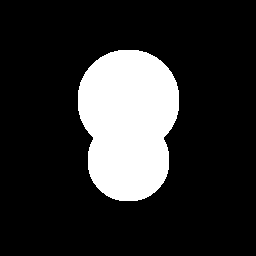

In [ ]:
#Show the converged boundary as a binary mask image
display(ImageOps.autocontrast(Image.fromarray(data[-1]).convert('L')))

In [ ]:
from PIL import ImageOps, Image

# Assuming `data[-1]` is the final boundary image
boundary_image = Image.fromarray(data[-1]).convert('L')

# Apply autocontrast to enhance the image
boundary_image = ImageOps.autocontrast(boundary_image)

# Display the image
boundary_image.show()

# Save the image
save_path = '/content/new levelset seg.png'
boundary_image.save(save_path)

# Display the save path
save_path


'/content/new levelset seg.png'

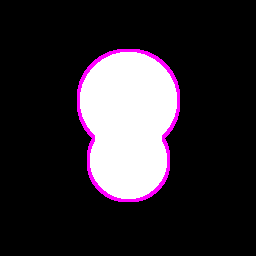

In [ ]:
#Show the converged boundary on the original
display(plot_boundary(img, data[-1]))

Original image mode: RGBA
Converted to grayscale: L
Sobel edge strength calculated.
MSE Value : 0.0 and Iteration number: 1
MSE Value : 0.0 and Iteration number: 2
Original image mode: RGBA
Converted to grayscale: L
Sobel edge strength calculated.
MSE Value : 0.028780582933954163 and Iteration number: 1
MSE Value : 0.037604919965221084 and Iteration number: 2
MSE Value : 0.03774291217686231 and Iteration number: 3
MSE Value : 0.03623266471673024 and Iteration number: 4
MSE Value : 0.0374226163664225 and Iteration number: 5
MSE Value : 0.038056602263315135 and Iteration number: 6
MSE Value : 0.03838012662818828 and Iteration number: 7
MSE Value : 0.03840252591551241 and Iteration number: 8
MSE Value : 0.038443068256977984 and Iteration number: 9
MSE Value : 0.038507368103561895 and Iteration number: 10
MSE Value : 0.038507368103561895 and Iteration number: 11
Original image mode: RGBA
Converted to grayscale: L
Sobel edge strength calculated.
MSE Value : 0.12080682119201952 and Iteration

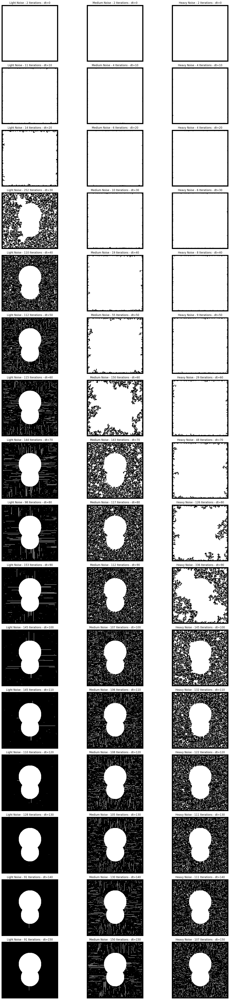

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# Load the noisy images
img_light = Image.open("/content/noise_light.png")
img_medium = Image.open("/content/noise_medium.png")
img_heavy = Image.open("/content/noise_heavy.png")

# Function to apply level set and plot for different dt values
def apply_level_set_for_dt(img, dt_values):
    results = []
    for dt in dt_values:
        data, niter = lss_new(img, dt=dt, freq=10)  # Apply new level set method
        results.append((data[-1], niter, dt))
    return results

# Define dt values: every 10th value from 0 to 150
dt_values = list(range(0, 151, 10))  # [0, 10, 20, ..., 150]

# Apply Level Set method on the noisy images for each type of noise
light_noise_results = apply_level_set_for_dt(img_light, dt_values)
medium_noise_results = apply_level_set_for_dt(img_medium, dt_values)
heavy_noise_results = apply_level_set_for_dt(img_heavy, dt_values)

# Plot the results for each noisy image with different dt values
fig, axes = plt.subplots(len(dt_values), 3, figsize=(18, 4 * len(dt_values)))

# Plot for each dt value in each row
for i, dt in enumerate(dt_values):
    # Light noise results
    axes[i, 0].imshow(ImageOps.autocontrast(Image.fromarray(light_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 0].set_title(f"Light Noise - {light_noise_results[i][1]} Iterations - dt={dt}")
    axes[i, 0].axis('off')

    # Medium noise results
    axes[i, 1].imshow(ImageOps.autocontrast(Image.fromarray(medium_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 1].set_title(f"Medium Noise - {medium_noise_results[i][1]} Iterations - dt={dt}")
    axes[i, 1].axis('off')

    # Heavy noise results
    axes[i, 2].imshow(ImageOps.autocontrast(Image.fromarray(heavy_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 2].set_title(f"Heavy Noise - {heavy_noise_results[i][1]} Iterations - dt={dt}")
    axes[i, 2].axis('off')

# Show the plot
plt.tight_layout()
plt.show()


#Saving a few results

Original image mode: RGBA
Converted to grayscale: L
Sobel edge strength calculated.
MSE Value : 0.8037181858892868 and Iteration number: 1
MSE Value : 0.7695626089499789 and Iteration number: 2
MSE Value : 0.7498142724495436 and Iteration number: 3
MSE Value : 0.7729970162800979 and Iteration number: 4
MSE Value : 0.7971333015986373 and Iteration number: 5
MSE Value : 1.1360471819375202 and Iteration number: 6
MSE Value : 1.1723051719521353 and Iteration number: 7
MSE Value : 1.1826945504611455 and Iteration number: 8
MSE Value : 1.4905756625277973 and Iteration number: 9
MSE Value : 1.3953475374412343 and Iteration number: 10
MSE Value : 1.6109119205824456 and Iteration number: 11
MSE Value : 1.7377784115645794 and Iteration number: 12
MSE Value : 1.604700779820401 and Iteration number: 13
MSE Value : 1.7628952191423342 and Iteration number: 14
MSE Value : 1.8598542354630498 and Iteration number: 15
MSE Value : 1.7355349569954486 and Iteration number: 16
MSE Value : 2.041031734264481 

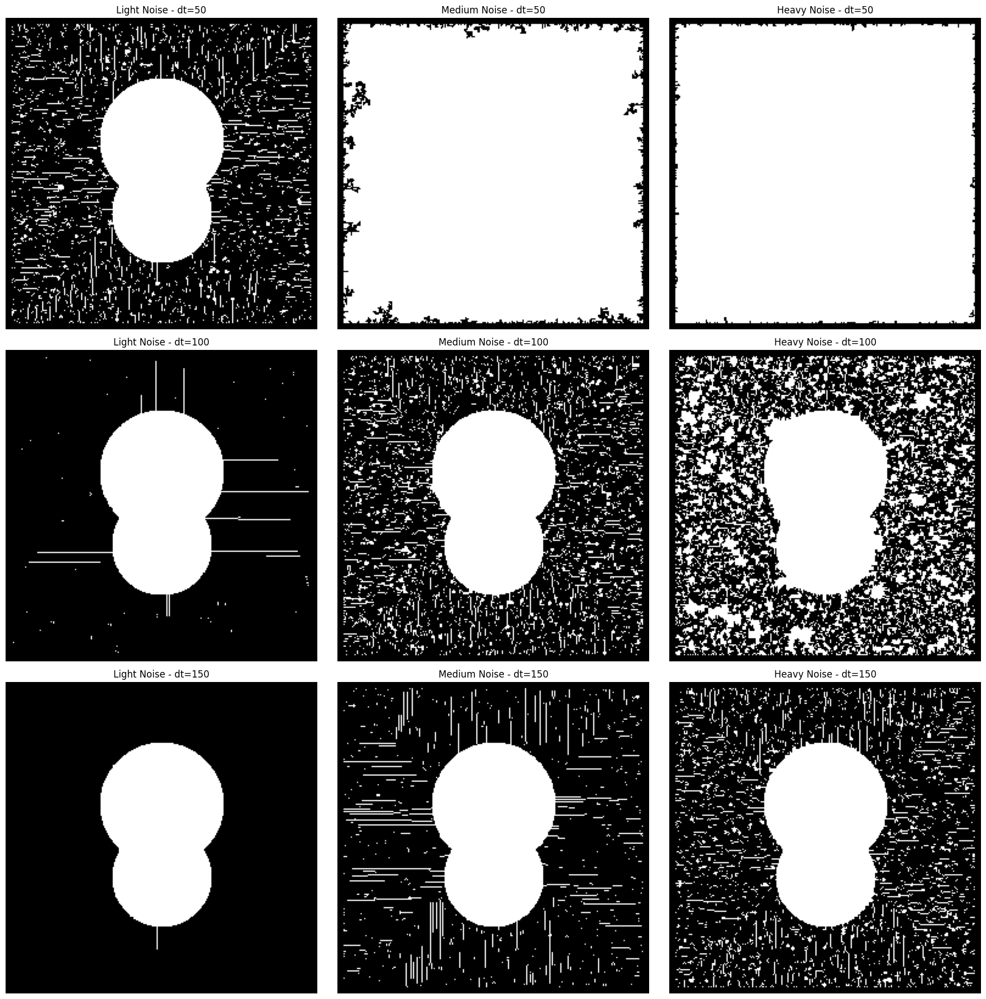

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# Load the noisy images
img_light = Image.open("/content/noise_light.png")
img_medium = Image.open("/content/noise_medium.png")
img_heavy = Image.open("/content/noise_heavy.png")

# Function to apply level set and plot for different dt values
def apply_level_set_for_dt(img, dt_values):
    results = []
    for dt in dt_values:
        data, niter = lss_new(img, dt=dt, freq=10)  # Apply new level set method
        results.append((data[-1], niter, dt))
    return results

# Define dt values: every 50th value from 0 to 150
dt_values = [50, 100, 150]  # [0, 50, 100, 150]

# Apply Level Set method on the noisy images for each type of noise
light_noise_results = apply_level_set_for_dt(img_light, dt_values)
medium_noise_results = apply_level_set_for_dt(img_medium, dt_values)
heavy_noise_results = apply_level_set_for_dt(img_heavy, dt_values)

# Plot the results for each noisy image with different dt values
fig, axes = plt.subplots(len(dt_values), 3, figsize=(18, 6 * len(dt_values)))

# Plot for each dt value in each row
for i, dt in enumerate(dt_values):
    # Light noise results
    axes[i, 0].imshow(ImageOps.autocontrast(Image.fromarray(light_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 0].set_title(f"Light Noise - dt={dt}")
    axes[i, 0].axis('off')

    # Medium noise results
    axes[i, 1].imshow(ImageOps.autocontrast(Image.fromarray(medium_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 1].set_title(f"Medium Noise - dt={dt}")
    axes[i, 1].axis('off')

    # Heavy noise results
    axes[i, 2].imshow(ImageOps.autocontrast(Image.fromarray(heavy_noise_results[i][0]).convert('L')), cmap='gray')
    axes[i, 2].set_title(f"Heavy Noise - dt={dt}")
    axes[i, 2].axis('off')

# Save the high-resolution plot
plt.tight_layout()
plt.savefig('/content/level_set_results_highres.png', dpi=300)

# Show the plot
plt.show()


#Save segmentations for new level set when dt = 150

#New lss

Original image mode: RGBA
Converted to grayscale: L
Sobel edge strength calculated.
MSE Value : 7.773338106897705 and Iteration number: 1
MSE Value : 6.427869688448925 and Iteration number: 2
MSE Value : 5.656326301685224 and Iteration number: 3
MSE Value : 5.0354002267938185 and Iteration number: 4
MSE Value : 4.58113592605654 and Iteration number: 5
MSE Value : 6.246121311511782 and Iteration number: 6
MSE Value : 5.797358675081787 and Iteration number: 7
MSE Value : 4.592181868622697 and Iteration number: 8
MSE Value : 6.111053515626082 and Iteration number: 9
MSE Value : 7.142977437629812 and Iteration number: 10
MSE Value : 5.607877960582462 and Iteration number: 11
MSE Value : 4.521856206043989 and Iteration number: 12
MSE Value : 4.634812062689035 and Iteration number: 13
MSE Value : 4.371516413271472 and Iteration number: 14
MSE Value : 5.115515929749026 and Iteration number: 15
MSE Value : 5.713925553090629 and Iteration number: 16
MSE Value : 5.4380155543706685 and Iteration 

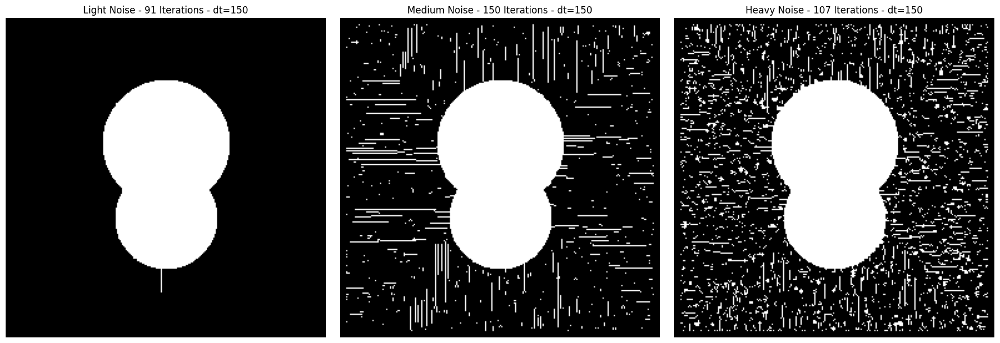

('/content/light_noise_segmentation_dt150.png',
 '/content/medium_noise_segmentation_dt150.png',
 '/content/heavy_noise_segmentation_dt150.png')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# Function to apply level set for a given dt value
def apply_level_set_for_dt(img, dt):
    data, niter = lss_new(img, dt=dt, freq=10)  # Apply new level set method
    return data[-1], niter  # Return the final segmentation and number of iterations

# Load the noisy images
img_light = Image.open("/content/noise_light.png")
img_medium = Image.open("/content/noise_medium.png")
img_heavy = Image.open("/content/noise_heavy.png")

# Set dt = 150
dt_value = 150

# Apply Level Set method for each noisy image with dt = 150
light_noise_result, light_noise_iterations = apply_level_set_for_dt(img_light, dt_value)
medium_noise_result, medium_noise_iterations = apply_level_set_for_dt(img_medium, dt_value)
heavy_noise_result, heavy_noise_iterations = apply_level_set_for_dt(img_heavy, dt_value)

# Save the results as PNG images
output_path_light = '/content/light_noise_segmentation_dt150.png'
output_path_medium = '/content/medium_noise_segmentation_dt150.png'
output_path_heavy = '/content/heavy_noise_segmentation_dt150.png'

# Save the segmented results as PNG
plt.imsave(output_path_light, light_noise_result, cmap='gray')
plt.imsave(output_path_medium, medium_noise_result, cmap='gray')
plt.imsave(output_path_heavy, heavy_noise_result, cmap='gray')

# Plot the segmented results for dt = 150
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot Light Noise result
axes[0].imshow(light_noise_result, cmap='gray')
axes[0].set_title(f"Light Noise - {light_noise_iterations} Iterations - dt={dt_value}")
axes[0].axis('off')

# Plot Medium Noise result
axes[1].imshow(medium_noise_result, cmap='gray')
axes[1].set_title(f"Medium Noise - {medium_noise_iterations} Iterations - dt={dt_value}")
axes[1].axis('off')

# Plot Heavy Noise result
axes[2].imshow(heavy_noise_result, cmap='gray')
axes[2].set_title(f"Heavy Noise - {heavy_noise_iterations} Iterations - dt={dt_value}")
axes[2].axis('off')

# Show the plot
plt.tight_layout()
plt.show()

# Return the paths of the saved images
output_path_light, output_path_medium, output_path_heavy


#Old lss

Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L
Original image mode: RGBA
Converted to grayscale: L
Before Gaussian blur mode: L
After Gaussian blur mode: L


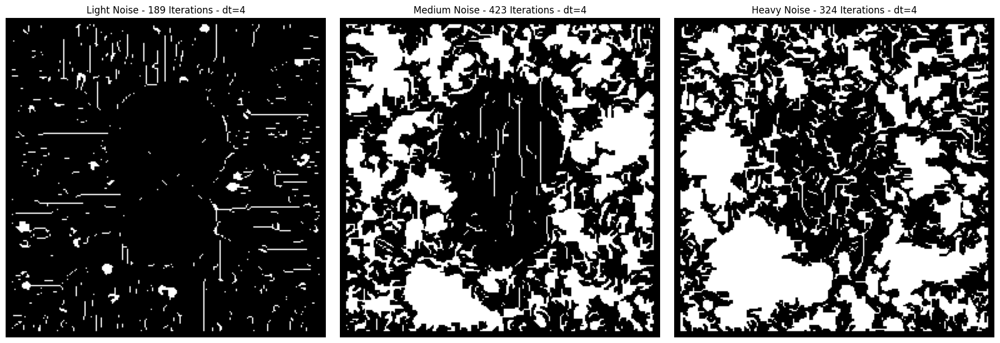

('/content/light_noise_segmentation_dt4.png',
 '/content/medium_noise_segmentation_dt4.png',
 '/content/heavy_noise_segmentation_dt4.png')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# Function to apply level set for a given dt value
def apply_level_set_for_dt(img, dt):
    data, niter = lss(img, dt=dt, freq=10)  # Apply new level set method
    return data[-1], niter  # Return the final segmentation and number of iterations

# Load the noisy images
img_light = Image.open("/content/noise_light.png")
img_medium = Image.open("/content/noise_medium.png")
img_heavy = Image.open("/content/noise_heavy.png")

# Set dt = 150
dt_value = 4

# Apply Level Set method for each noisy image with dt = 150
light_noise_result, light_noise_iterations = apply_level_set_for_dt(img_light, dt_value)
medium_noise_result, medium_noise_iterations = apply_level_set_for_dt(img_medium, dt_value)
heavy_noise_result, heavy_noise_iterations = apply_level_set_for_dt(img_heavy, dt_value)

# Save the results as PNG images
output_path_light = '/content/light_noise_segmentation_dt4.png'
output_path_medium = '/content/medium_noise_segmentation_dt4.png'
output_path_heavy = '/content/heavy_noise_segmentation_dt4.png'

# Save the segmented results as PNG
plt.imsave(output_path_light, light_noise_result, cmap='gray')
plt.imsave(output_path_medium, medium_noise_result, cmap='gray')
plt.imsave(output_path_heavy, heavy_noise_result, cmap='gray')

# Plot the segmented results for dt = 150
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot Light Noise result
axes[0].imshow(light_noise_result, cmap='gray')
axes[0].set_title(f"Light Noise - {light_noise_iterations} Iterations - dt={dt_value}")
axes[0].axis('off')

# Plot Medium Noise result
axes[1].imshow(medium_noise_result, cmap='gray')
axes[1].set_title(f"Medium Noise - {medium_noise_iterations} Iterations - dt={dt_value}")
axes[1].axis('off')

# Plot Heavy Noise result
axes[2].imshow(heavy_noise_result, cmap='gray')
axes[2].set_title(f"Heavy Noise - {heavy_noise_iterations} Iterations - dt={dt_value}")
axes[2].axis('off')

# Show the plot
plt.tight_layout()
plt.show()

# Return the paths of the saved images
output_path_light, output_path_medium, output_path_heavy


#New method IOU on noisy image

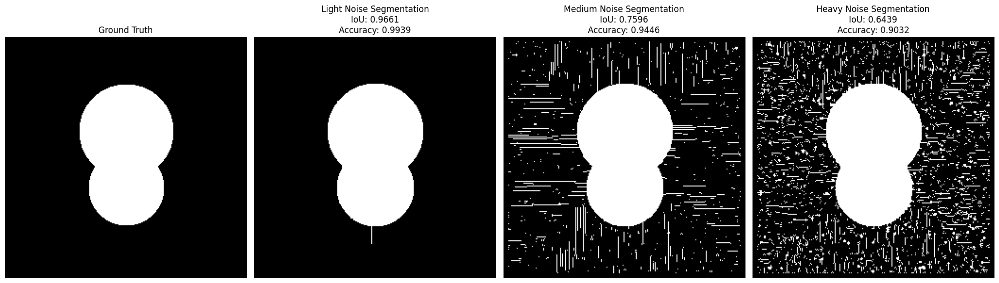

In [ ]:
# Re-load the segmentation images and ground truth mask
from skimage.io import imread
from skimage.transform import resize

# Load the ground truth mask (true_mask)
true_mask = imread("/content/circle.png")  # Ground truth

# Remove the 3rd dimension if it's present
if len(true_mask.shape) == 3:
    true_mask = true_mask[:, :, 0]  # Keep only the first channel

# Load the segmented images from the noisy images with different dt values
light_noise_segmentation = imread('/content/light_noise_segmentation_dt150.png')  # Light noise segmentation
medium_noise_segmentation = imread('/content/medium_noise_segmentation_dt150.png')  # Medium noise segmentation
heavy_noise_segmentation = imread('/content/heavy_noise_segmentation_dt150.png')  # Heavy noise segmentation

# Remove the 3rd dimension if it's present
if len(light_noise_segmentation.shape) == 3:
    light_noise_segmentation = light_noise_segmentation[:, :, 0]

if len(medium_noise_segmentation.shape) == 3:
    medium_noise_segmentation = medium_noise_segmentation[:, :, 0]

if len(heavy_noise_segmentation.shape) == 3:
    heavy_noise_segmentation = heavy_noise_segmentation[:, :, 0]

# Resize all segmentation results to match the ground truth size
true_mask_shape = true_mask.shape

# Resize the segmentation masks to match the true mask size
light_noise_segmentation_resized = resize(light_noise_segmentation, true_mask_shape, anti_aliasing=True)
medium_noise_segmentation_resized = resize(medium_noise_segmentation, true_mask_shape, anti_aliasing=True)
heavy_noise_segmentation_resized = resize(heavy_noise_segmentation, true_mask_shape, anti_aliasing=True)

# Ensure that all masks are binary (values 0 or 1)
light_noise_segmentation_resized = (light_noise_segmentation_resized > 0.5).astype(int)
medium_noise_segmentation_resized = (medium_noise_segmentation_resized > 0.5).astype(int)
heavy_noise_segmentation_resized = (heavy_noise_segmentation_resized > 0.5).astype(int)
true_mask_binary = (true_mask > 0.5).astype(int)

# Function to calculate Intersection over Union (IoU)
def calculate_iou(pred_mask, true_mask):
    # Flatten the masks to 1D arrays
    pred_mask_flat = pred_mask.flatten()
    true_mask_flat = true_mask.flatten()

    # Calculate the Intersection over Union (IoU)
    intersection = np.logical_and(pred_mask_flat, true_mask_flat)
    union = np.logical_or(pred_mask_flat, true_mask_flat)
    return intersection.sum() / float(union.sum())

# Calculate IoU for Light, Medium, and Heavy Noise Segmentation
iou_light = calculate_iou(light_noise_segmentation_resized, true_mask_binary)
iou_medium = calculate_iou(medium_noise_segmentation_resized, true_mask_binary)
iou_heavy = calculate_iou(heavy_noise_segmentation_resized, true_mask_binary)

# Function to calculate accuracy
def calculate_accuracy(pred_mask, true_mask):
    # Flatten the masks to 1D arrays
    pred_mask_flat = pred_mask.flatten()
    true_mask_flat = true_mask.flatten()

    # Calculate accuracy as the percentage of correct pixels
    correct_pixels = np.sum(pred_mask_flat == true_mask_flat)
    total_pixels = pred_mask_flat.size
    return correct_pixels / total_pixels

# Calculate accuracy for Light, Medium, and Heavy Noise Segmentation
accuracy_light = calculate_accuracy(light_noise_segmentation_resized, true_mask_binary)
accuracy_medium = calculate_accuracy(medium_noise_segmentation_resized, true_mask_binary)
accuracy_heavy = calculate_accuracy(heavy_noise_segmentation_resized, true_mask_binary)

# Plot the ground truth and the segmentation results with accuracy
fig, axes = plt.subplots(1, 4, figsize=(20, 6))

# Ground Truth
axes[0].imshow(true_mask, cmap='gray')
axes[0].set_title("Ground Truth")
axes[0].axis('off')

# Light Noise Segmentation
axes[1].imshow(light_noise_segmentation_resized, cmap='gray')
axes[1].set_title(f"Light Noise Segmentation\nIoU: {iou_light:.4f}\nAccuracy: {accuracy_light:.4f}")
axes[1].axis('off')

# Medium Noise Segmentation
axes[2].imshow(medium_noise_segmentation_resized, cmap='gray')
axes[2].set_title(f"Medium Noise Segmentation\nIoU: {iou_medium:.4f}\nAccuracy: {accuracy_medium:.4f}")
axes[2].axis('off')

# Heavy Noise Segmentation
axes[3].imshow(heavy_noise_segmentation_resized, cmap='gray')
axes[3].set_title(f"Heavy Noise Segmentation\nIoU: {iou_heavy:.4f}\nAccuracy: {accuracy_heavy:.4f}")
axes[3].axis('off')

plt.tight_layout()
plt.show()


#Old method iou on noisy images

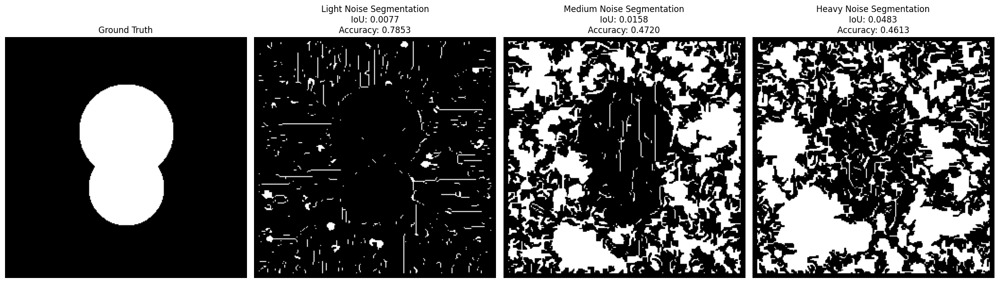

In [ ]:
# Re-import and process the segmentation images as well as ground truth

from skimage.io import imread
from skimage.transform import resize

# Load the ground truth mask (true_mask)
true_mask = imread("/content/circle.png")  # Ground truth

# Remove the 3rd dimension if it's present
if len(true_mask.shape) == 3:
    true_mask = true_mask[:, :, 0]  # Keep only the first channel

# Load the segmented images from the noisy images with different dt values
light_noise_segmentation = imread('/content/light_noise_segmentation_dt4.png')  # Light noise segmentation
medium_noise_segmentation = imread('/content/medium_noise_segmentation_dt4.png')  # Medium noise segmentation
heavy_noise_segmentation = imread('/content/heavy_noise_segmentation_dt4.png')  # Heavy noise segmentation

# Remove the 3rd dimension if it's present
if len(light_noise_segmentation.shape) == 3:
    light_noise_segmentation = light_noise_segmentation[:, :, 0]

if len(medium_noise_segmentation.shape) == 3:
    medium_noise_segmentation = medium_noise_segmentation[:, :, 0]

if len(heavy_noise_segmentation.shape) == 3:
    heavy_noise_segmentation = heavy_noise_segmentation[:, :, 0]

# Resize all segmentation results to match the ground truth size
true_mask_shape = true_mask.shape

# Resize the segmentation masks to match the true mask size
light_noise_segmentation_resized = resize(light_noise_segmentation, true_mask_shape, anti_aliasing=True)
medium_noise_segmentation_resized = resize(medium_noise_segmentation, true_mask_shape, anti_aliasing=True)
heavy_noise_segmentation_resized = resize(heavy_noise_segmentation, true_mask_shape, anti_aliasing=True)

# Ensure that all masks are binary (values 0 or 1)
light_noise_segmentation_resized = (light_noise_segmentation_resized > 0.5).astype(int)
medium_noise_segmentation_resized = (medium_noise_segmentation_resized > 0.5).astype(int)
heavy_noise_segmentation_resized = (heavy_noise_segmentation_resized > 0.5).astype(int)
true_mask_binary = (true_mask > 0.5).astype(int)

# Function to calculate Intersection over Union (IoU)
def calculate_iou(pred_mask, true_mask):
    # Flatten the masks to 1D arrays
    pred_mask_flat = pred_mask.flatten()
    true_mask_flat = true_mask.flatten()

    # Calculate the Intersection over Union (IoU)
    intersection = np.logical_and(pred_mask_flat, true_mask_flat)
    union = np.logical_or(pred_mask_flat, true_mask_flat)
    return intersection.sum() / float(union.sum())

# Calculate IoU for Light, Medium, and Heavy Noise Segmentation
iou_light = calculate_iou(light_noise_segmentation_resized, true_mask_binary)
iou_medium = calculate_iou(medium_noise_segmentation_resized, true_mask_binary)
iou_heavy = calculate_iou(heavy_noise_segmentation_resized, true_mask_binary)

# Function to calculate accuracy
def calculate_accuracy(pred_mask, true_mask):
    # Flatten the masks to 1D arrays
    pred_mask_flat = pred_mask.flatten()
    true_mask_flat = true_mask.flatten()

    # Calculate accuracy as the percentage of correct pixels
    correct_pixels = np.sum(pred_mask_flat == true_mask_flat)
    total_pixels = pred_mask_flat.size
    return correct_pixels / total_pixels

# Calculate accuracy for Light, Medium, and Heavy Noise Segmentation
accuracy_light = calculate_accuracy(light_noise_segmentation_resized, true_mask_binary)
accuracy_medium = calculate_accuracy(medium_noise_segmentation_resized, true_mask_binary)
accuracy_heavy = calculate_accuracy(heavy_noise_segmentation_resized, true_mask_binary)

# Plot the ground truth and the segmentation results with accuracy
fig, axes = plt.subplots(1, 4, figsize=(20, 6))

# Ground Truth
axes[0].imshow(true_mask, cmap='gray')
axes[0].set_title("Ground Truth")
axes[0].axis('off')

# Light Noise Segmentation
axes[1].imshow(light_noise_segmentation_resized, cmap='gray')
axes[1].set_title(f"Light Noise Segmentation\nIoU: {iou_light:.4f}\nAccuracy: {accuracy_light:.4f}")
axes[1].axis('off')

# Medium Noise Segmentation
axes[2].imshow(medium_noise_segmentation_resized, cmap='gray')
axes[2].set_title(f"Medium Noise Segmentation\nIoU: {iou_medium:.4f}\nAccuracy: {accuracy_medium:.4f}")
axes[2].axis('off')

# Heavy Noise Segmentation
axes[3].imshow(heavy_noise_segmentation_resized, cmap='gray')
axes[3].set_title(f"Heavy Noise Segmentation\nIoU: {iou_heavy:.4f}\nAccuracy: {accuracy_heavy:.4f}")
axes[3].axis('off')

plt.tight_layout()
plt.show()


#snake level set and new level set

In [ ]:
import numpy as np
from skimage.io import imread
from skimage.transform import resize

# Load the ground truth mask (true_mask)
true_mask = imread("/content/circle.png")  # Load the true mask (ground truth)

# Load the segmentation results from Simple Level Set, New Level Set, and Snake Model
simple_level_set_mask = imread("/content/simpel levelset seg.png")  # Simple Level Set result
new_level_set_mask = imread("/content/new levelset seg.png")  # New Level Set result
snake_mask = imread("/content/snake_segmentation_result.png")  # Snake model result

# Function to remove the third dimension if it exists
def remove_third_dimension(image):
    if len(image.shape) > 2:
        return image[:, :, 0]  # Keep only the first channel
    return image

# Remove the third dimension from all images
true_mask = remove_third_dimension(true_mask)
simple_level_set_mask = remove_third_dimension(simple_level_set_mask)
new_level_set_mask = remove_third_dimension(new_level_set_mask)
snake_mask = remove_third_dimension(snake_mask)

# Resize all masks to match the true mask size
true_mask_shape = true_mask.shape

# Resize the segmentation masks to match the true mask size
simple_level_set_mask_resized = resize(simple_level_set_mask, true_mask_shape, anti_aliasing=True)
new_level_set_mask_resized = resize(new_level_set_mask, true_mask_shape, anti_aliasing=True)
snake_mask_resized = resize(snake_mask, true_mask_shape, anti_aliasing=True)

# Ensure all masks are binary (values 0 or 1)
simple_level_set_mask_resized = (simple_level_set_mask_resized > 0.5).astype(int)
new_level_set_mask_resized = (new_level_set_mask_resized > 0.5).astype(int)
snake_mask_resized = (snake_mask_resized > 0.5).astype(int)
true_mask_binary = (true_mask > 0.5).astype(int)

# Print the shape of each image after removing the third dimension
print(f"Shape of Ground Truth: {true_mask.shape}")
print(f"Shape of Simple Level Set Segmentation: {simple_level_set_mask_resized.shape}")
print(f"Shape of New Level Set Segmentation: {new_level_set_mask_resized.shape}")
print(f"Shape of Snake Model Segmentation: {snake_mask_resized.shape}")


Shape of Ground Truth: (256, 256)
Shape of Simple Level Set Segmentation: (256, 256)
Shape of New Level Set Segmentation: (256, 256)
Shape of Snake Model Segmentation: (256, 256)


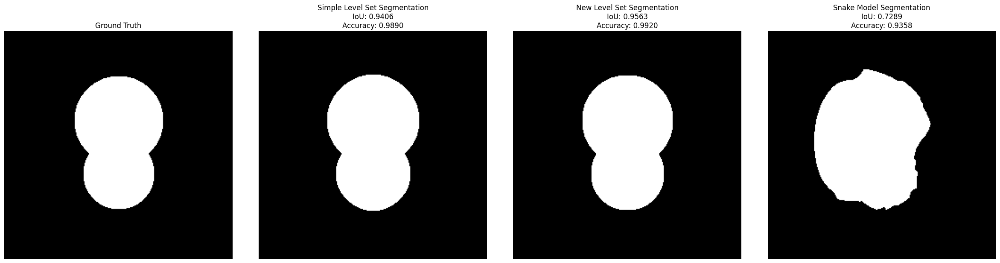

IoU for Simple Level Set: 0.9406, Accuracy: 0.9890
IoU for New Level Set: 0.9563, Accuracy: 0.9920
IoU for Snake Model: 0.7289, Accuracy: 0.9358


In [ ]:
from sklearn.metrics import jaccard_score

# Function to calculate Intersection over Union (IoU)
def calculate_iou(pred_mask, true_mask):
    # Flatten the masks to 1D arrays
    pred_mask_flat = pred_mask.flatten()
    true_mask_flat = true_mask.flatten()

    # Calculate the Intersection over Union (IoU)
    return jaccard_score(true_mask_flat, pred_mask_flat)

# Function to calculate accuracy
def calculate_accuracy(pred_mask, true_mask):
    # Flatten the masks to 1D arrays
    pred_mask_flat = pred_mask.flatten()
    true_mask_flat = true_mask.flatten()

    # Calculate accuracy as the percentage of correct pixelsobel filters on the BSDS500 test set,
    correct_pixels = np.sum(pred_mask_flat == true_mask_flat)
    total_pixels = pred_mask_flat.size
    return correct_pixels / total_pixels

# Calculate IoU and accuracy for each segmentation method
iou_simple = calculate_iou(simple_level_set_mask_resized, true_mask_binary)
iou_new = calculate_iou(new_level_set_mask_resized, true_mask_binary)
iou_snake = calculate_iou(snake_mask_resized, true_mask_binary)

accuracy_simple = calculate_accuracy(simple_level_set_mask_resized, true_mask_binary)
accuracy_new = calculate_accuracy(new_level_set_mask_resized, true_mask_binary)
accuracy_snake = calculate_accuracy(snake_mask_resized, true_mask_binary)

# Plot the ground truth and the segmentation results with IoU and accuracy
fig, axes = plt.subplots(1, 4, figsize=(24, 6))

# Ground Truth
axes[0].imshow(true_mask, cmap='gray')
axes[0].set_title("Ground Truth")
axes[0].axis('off')

# Simple Level Set Segmentation
axes[1].imshow(simple_level_set_mask_resized, cmap='gray')
axes[1].set_title(f"Simple Level Set Segmentation\nIoU: {iou_simple:.4f}\nAccuracy: {accuracy_simple:.4f}")
axes[1].axis('off')

# New Level Set Segmentation
axes[2].imshow(new_level_set_mask_resized, cmap='gray')
axes[2].set_title(f"New Level Set Segmentation\nIoU: {iou_new:.4f}\nAccuracy: {accuracy_new:.4f}")
axes[2].axis('off')

# Snake Model Segmentation
axes[3].imshow(snake_mask_resized, cmap='gray')
axes[3].set_title(f"Snake Model Segmentation\nIoU: {iou_snake:.4f}\nAccuracy: {accuracy_snake:.4f}")
axes[3].axis('off')

plt.tight_layout()
plt.show()

# Print the IoU and accuracy results
print(f"IoU for Simple Level Set: {iou_simple:.4f}, Accuracy: {accuracy_simple:.4f}")
print(f"IoU for New Level Set: {iou_new:.4f}, Accuracy: {accuracy_new:.4f}")
print(f"IoU for Snake Model: {iou_snake:.4f}, Accuracy: {accuracy_snake:.4f}")
